In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import mplleaflet
from geopandas.plotting import plot_polygon_collection
import tilemapbase
tilemapbase.init(create=True)
import folium
from folium.features import DivIcon
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.colors as mcolors
import seaborn as sns

Tokyo_grid = pd.read_csv('/home/is/shuntaro-o/dev/compare_population_and_tweet_number/data/grid_data/SDDSWS5339/Tokyo_grid.csv')
Kyoto_grid = pd.read_csv('/home/is/shuntaro-o/dev/compare_population_and_tweet_number/data/grid_data/QDDSWQ5235/Kyoto_grid.csv')


In [2]:
# Seabornのカラーパレットを取得
palette = sns.color_palette("Reds", 7)  # 例として "deep" パレットを使用

# カラーパレットの各色をhex値に変換
hex_values = [mcolors.to_hex(color) for color in palette]

# 結果の表示
print(hex_values)

['#fee0d2', '#fcbba1', '#fc9272', '#fb694a', '#ee3a2c', '#ca181d', '#a30f15']


In [3]:
palette

[(0.9960476739715494, 0.8778623606305267, 0.8227758554402153),
 (0.9882352941176471, 0.732072279892349, 0.6299269511726259),
 (0.9881891580161477, 0.5707035755478662, 0.44521337946943484),
 (0.9835755478662053, 0.4127950788158401, 0.28835063437139563),
 (0.9344867358708189, 0.2286812764321415, 0.17139561707035755),
 (0.7925720876585928, 0.09328719723183392, 0.11298731257208766),
 (0.6403844675124952, 0.05720876585928489, 0.08149173394848133)]

In [4]:
Tokyo_residents_max = Tokyo_grid['residents'].max()
Tokyo_residents_min = Tokyo_grid['residents'].min()
Kyoto_residents_max = Kyoto_grid['residents'].max()
Kyoto_residents_min = Kyoto_grid['residents'].min()

In [5]:
interval_values = np.linspace(Tokyo_residents_min, Tokyo_residents_max, 7)
interval_values
# interval_values = np.linspace(Tokyo_residents_min, Tokyo_residents_max, 6)
# interval_values

array([1.00000000e+00, 5.45183333e+03, 1.09026667e+04, 1.63535000e+04,
       2.18043333e+04, 2.72551667e+04, 3.27060000e+04])

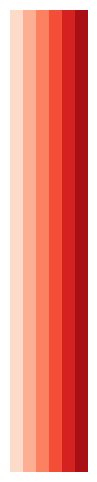

In [6]:
palette = sns.color_palette("Reds", 6)

# パレットを画像として作成
fig, ax = plt.subplots(figsize=(1, 6))
cmap = sns.color_palette(palette)
cmap = np.array(cmap).reshape(1, -1, 3)
ax.imshow(cmap, aspect='auto')
ax.axis('off')

# 画像を保存
plt.savefig('color_palette.png', bbox_inches='tight', pad_inches=0.1, transparent=True)
plt.show()

In [7]:
def find_interval(number, interval_values):
    """
    入力された数字がinterval_valuesのどの範囲に属するかを判定する関数

    Parameters:
    - number: 判定する数字
    - interval_values: 区間の配列

    Returns:
    - interval: 数字が属する区間（例: (0, 20)）
    """
    for i in range(len(interval_values) - 1):
        if interval_values[i] <= number <= interval_values[i + 1]:
            return i
    # 数字がどの範囲にも属さない場合
    return None

In [8]:
Tokyo_grid['color_num'] = Tokyo_grid['residents'].apply(lambda x: find_interval(x, interval_values))

In [9]:
Tokyo_map = folium.Map(location=[35.690921, 139.700258], zoom_start=15, tiles='openstreetmap')
# folium.TileLayer('stamentoner').add_to(Tokyo_map)
meth_list=[53394611, 52353680, 52354610, 52354642, 52354513, 52354548, 52353692, 52354519, 52353579]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22']
place_list = ['Tokyo Staion', 'Kyoto Station', 'Nakagyo ward', 'Kyoto university', 'Arashiyama', 'Kinkaku-ji temple', 'Kiyomizu-dera temple', 'Nijo-jo castle', 'To-ji temple']
place_snwe = [[35.675, 139.7625, 35.683333333333, 139.775],
              [34.983333333333, 135.75, 34.99166666666, 135.7625],
              [35.008333333333, 135.75, 35.016666666667, 135.7625],
              [35.033333333333, 135.775, 35.041666666667, 135.7875],
              [35.008333333333, 135.6625, 35.016666666667, 135.675],
              [35.033333333333, 135.725, 35.041666666667, 135.7375],
              [34.991666666667, 135.775, 35, 135.7875],
              [35.008333333333, 135.7375, 35.01666666666, 135.75],
              [34.975, 135.7375, 34.983333333333, 135.75]]

for i in range(len(Tokyo_grid)):
    s = Tokyo_grid.miny[i]
    w = Tokyo_grid.minx[i]
    n = Tokyo_grid.maxy[i]
    e = Tokyo_grid.maxx[i]


    if pd.isna(Tokyo_grid['color_num'][i]):  # もしくは df['num'].isna().iloc[i] でも可
        folium.Polygon(
            color = 'gray',
            locations=[[s,w], [s,e], [n,e], [n,w]], # 多角形の頂点
            weight=1, # 線の太さ
            fill=False, # 塗りつぶす
            fill_opacity=0.5, # 透明度（1=不透明）
        ).add_to(Tokyo_map)
    else:
        folium.Polygon(
            color=hex_values[int(Tokyo_grid['color_num'][i])],
            fill_color=hex_values[int(Tokyo_grid['color_num'][i])],
            locations=[[s,w], [s,e], [n,e], [n,w]], # 多角形の頂点
            weight=1, # 線の太さ
            fill=True, # 塗りつぶす
            fill_opacity=0.8, # 透明度（1=不透明）
        ).add_to(Tokyo_map)

for idx, snwe in enumerate(place_snwe):
    s = snwe[0]
    w = snwe[1]
    n = snwe[2]
    e = snwe[3]



    folium.Polygon(
        locations=[[s,w], [s,e], [n,e], [n,w]], # 多角形の頂点
        color="blue", # 線の色
        weight=2, # 線の太さ
    ).add_to(Tokyo_map)



    folium.Marker(location=[(s+n)/2 + 0.004, (w+e)/2 - 0.005], icon=DivIcon(
        icon_size=(80, 25),
        icon_anchor=(0, 0),
        html='<div style="text-align: left; font-size: 30pt; color : black width: 300px; height: 100px, font-weight: 1000">'+ place_list[idx] +'</div>')
    ).add_to(Tokyo_map)
Tokyo_map


In [12]:
Tokyo_map = folium.Map(location=[35.679165, 139.76875], zoom_start=14, tiles='openstreetmap')
# folium.TileLayer('stamentoner').add_to(Tokyo_map)
meth_list=[53394611, 52353680, 52354610, 52354642, 52354513, 52354548, 52353692, 52354519, 52353579]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22']
place_list = ['Tokyo Staion', 'Kyoto Station', 'Nakagyo ward', 'Kyoto university', 'Arashiyama', 'Kinkaku-ji temple', 'Kiyomizu-dera temple', 'Nijo-jo castle', 'To-ji temple']
place_snwe = [[35.675, 139.7625, 35.683333333333, 139.775],
              [34.983333333333, 135.75, 34.99166666666, 135.7625],
              [35.008333333333, 135.75, 35.016666666667, 135.7625],
              [35.033333333333, 135.775, 35.041666666667, 135.7875],
              [35.008333333333, 135.6625, 35.016666666667, 135.675],
              [35.033333333333, 135.725, 35.041666666667, 135.7375],
              [34.991666666667, 135.775, 35, 135.7875],
              [35.008333333333, 135.7375, 35.01666666666, 135.75],
              [34.975, 135.7375, 34.983333333333, 135.75]]

for i in range(len(Tokyo_grid)):
    s = Tokyo_grid.miny[i]
    w = Tokyo_grid.minx[i]
    n = Tokyo_grid.maxy[i]
    e = Tokyo_grid.maxx[i]

    if  Tokyo_grid.key[i] == 53394611:
        folium.Polygon(
            color=hex_values[int(Tokyo_grid['color_num'][i])],
            fill_color=hex_values[int(Tokyo_grid['color_num'][i])],
            locations=[[s,w], [s,e], [n,e], [n,w]], # 多角形の頂点
            weight=1, # 線の太さ
            fill=False, # 塗りつぶす
            fill_opacity=0.8, # 透明度（1=不透明）
        ).add_to(Tokyo_map)

for idx, snwe in enumerate(place_snwe):
    s = snwe[0]
    w = snwe[1]
    n = snwe[2]
    e = snwe[3]



    folium.Polygon(
        locations=[[s,w], [s,e], [n,e], [n,w]], # 多角形の頂点
        color="black", # 線の色
        weight=2, # 線の太さ
    ).add_to(Tokyo_map)



    # folium.Marker(location=[(s+n)/2 + 0.004, (w+e)/2 - 0.005], icon=DivIcon(
    #     icon_size=(80, 25),
    #     icon_anchor=(0, 0),
    #     html='<div style="text-align: left; font-size: 30pt; color : black width: 300px; height: 100px, font-weight: 1000">'+ place_list[idx] +'</div>')
    # ).add_to(Tokyo_map)
Tokyo_map

In [21]:
Tokyo_map = folium.Map(location=[35.679165, 139.76875], zoom_start=14, tiles='openstreetmap')
# folium.TileLayer('stamentoner').add_to(Tokyo_map)
meth_list=[53394611, 52353680, 52354610, 52354642, 52354513, 52354548, 52353692, 52354519, 52353579]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22']
place_list = ['Tokyo Staion', 'Kyoto Station', 'Nakagyo ward', 'Kyoto university', 'Arashiyama', 'Kinkaku-ji temple', 'Kiyomizu-dera temple', 'Nijo-jo castle', 'To-ji temple']
place_snwe = [[35.675, 139.7625, 35.683333333333, 139.775],
              [34.983333333333, 135.75, 34.99166666666, 135.7625],
              [35.008333333333, 135.75, 35.016666666667, 135.7625],
              [35.033333333333, 135.775, 35.041666666667, 135.7875],
              [35.008333333333, 135.6625, 35.016666666667, 135.675],
              [35.033333333333, 135.725, 35.041666666667, 135.7375],
              [34.991666666667, 135.775, 35, 135.7875],
              [35.008333333333, 135.7375, 35.01666666666, 135.75],
              [34.975, 135.7375, 34.983333333333, 135.75]]

for i in range(len(Tokyo_grid)):
    s = Tokyo_grid.miny[i]
    w = Tokyo_grid.minx[i]
    n = Tokyo_grid.maxy[i]
    e = Tokyo_grid.maxx[i]


    if pd.isna(Tokyo_grid['color_num'][i]):  # もしくは df['num'].isna().iloc[i] でも可
        folium.Polygon(
            color = 'black',
            locations=[[s,w], [s,e], [n,e], [n,w]], # 多角形の頂点
            weight=1, # 線の太さ
            fill=False, # 塗りつぶす
            fill_opacity=0.5, # 透明度（1=不透明）
        ).add_to(Tokyo_map)
    else:
        folium.Polygon(
            # color=hex_values[int(Tokyo_grid['color_num'][i])],
            # fill_color=hex_values[int(Tokyo_grid['color_num'][i])],
            color = 'black',
            locations=[[s,w], [s,e], [n,e], [n,w]], # 多角形の頂点
            weight=1, # 線の太さ
            fill=False, # 塗りつぶす
            fill_opacity=0.8, # 透明度（1=不透明）
        ).add_to(Tokyo_map)

for idx, snwe in enumerate(place_snwe):
    s = snwe[0]
    w = snwe[1]
    n = snwe[2]
    e = snwe[3]



    folium.Polygon(
        locations=[[s,w], [s,e], [n,e], [n,w]], # 多角形の頂点
        color="brack", # 線の色
        weight=2, # 線の太さ
    ).add_to(Tokyo_map)

Tokyo_map
